In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, Polygon
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import branca as bc
import folium

In [4]:
map = gpd.read_file('data/water_quality/City_boundaries/City_boundaries.shp')
map.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [5]:
crs = {'init':'epsg:4326'}

In [6]:
ddw_la = pd.read_csv('data/gama_ddw_losangeles_v2/gama_ddw_losangeles_v2.txt', sep='\t')

C:\Users\Radhai\AppData\Local\Temp\ipykernel_16296\1994669755.py:1: DtypeWarning: Columns (25,27,28) have mixed types. Specify dtype option on import or set low_memory=False.
  ddw_la = pd.read_csv('data/gama_ddw_losangeles_v2/gama_ddw_losangeles_v2.txt', sep='\t')


In [7]:
ddw_la.head()

,GM_DATASET_NAME,GM_WELL_CATEGORY,GM_DATA_SOURCE,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_SAMP_COLLECTION_DATE,...,SRC_SAMP_COLLECTION_TIME,SRC_REPORTING_LIMIT,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,SRC_LATITUDE,SRC_LONGITUDE,SRC_DATUM,SRC_WELL_DEPTH_FT,SRC_TOP_DEPTH_OF_SCREEN_FT,SRC_BOTTOM_DEPTH_OF_SCREEN_FT
0,DDW,MUNICIPAL,DDW,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,05/08/2008,...,1007,2.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
1,DDW,MUNICIPAL,DDW,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,05/08/2008,...,1738,2.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
2,DDW,MUNICIPAL,DDW,CA1502595_001_001,SC,Specific Conductivity,=,570.00,UMHOS/CM,09/08/2008,...,925,0.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
3,DDW,MUNICIPAL,DDW,CA1502595_001_001,PH,pH,=,7.72,PH UNITS,09/08/2008,...,925,0.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN
4,DDW,MUNICIPAL,DDW,CA1502595_001_001,ALK,"Alkalinity, total",=,230.00,MG/L,09/08/2008,...,925,0.0,NaN,7625,34.814154,-118.693737,NaN,NaN,NaN,NaN


In [8]:
ddw_la.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4513134 entries, 0 to 4513133
Data columns (total 35 columns):
 #   Column                         Non-Null Count    Dtype  
---  ------                         --------------    -----  
 0   GM_DATASET_NAME                4513134 non-null  object 
 1   GM_WELL_CATEGORY               4513134 non-null  object 
 2   GM_DATA_SOURCE                 4513134 non-null  object 
 3   GM_WELL_ID                     4513134 non-null  object 
 4   GM_CHEMICAL_VVL                4497021 non-null  object 
 5   GM_CHEMICAL_NAME               4513134 non-null  object 
 6   GM_RESULT_MODIFIER             4513134 non-null  object 
 7   GM_RESULT                      4513134 non-null  float64
 8   GM_RESULT_UNITS                4513134 non-null  object 
 9   GM_SAMP_COLLECTION_DATE        4513134 non-null  object 
 10  GM_REPORTING_LIMIT             3404326 non-null  float64
 11  GM_LATITUDE                    4513134 non-null  float64
 12  GM_LONGITUDE  

In [9]:
for col in ddw_la.columns:
    print(ddw_la[col].value_counts())
    print('------------------------------------------------------')

DDW    4513134
Name: GM_DATASET_NAME, dtype: int64
------------------------------------------------------
MUNICIPAL    4513134
Name: GM_WELL_CATEGORY, dtype: int64
------------------------------------------------------
DDW    4513134
Name: GM_DATA_SOURCE, dtype: int64
------------------------------------------------------
CA1910048_004_004    35325
CA1910043_025_025    35178
CA1910092_006_006    35050
CA1910048_005_005    34393
CA1910043_026_026    23577
                     ...  
CA1910042_001_001        1
CA1910146_002_002        1
CA1900127_003_003        1
CA1900127_002_002        1
CA1910077_008_008        1
Name: GM_WELL_ID, Length: 1941, dtype: int64
------------------------------------------------------
NO3N          117897
PCE           109080
TCE           108575
CTCL           79181
DCE11          78251
               ...  
TNT                7
HMX                7
FONOFOS            5
NALED              2
PERMETHRIN         1
Name: GM_CHEMICAL_VVL, Length: 225, dtype: int64

In [10]:
del_cols = ['GM_DATASET_NAME','GM_WELL_CATEGORY','GM_DATA_SOURCE','GM_WELL_DEPTH_FT','GM_CAS_NUMBER','GM_ALTWELL_ID2','GM_ALTWELL_ID3','SRC_DATUM','SRC_WELL_DEPTH_FT','SRC_TOP_DEPTH_OF_SCREEN_FT','SRC_BOTTOM_DEPTH_OF_SCREEN_FT']

In [11]:
ddw = ddw_la.drop(del_cols, axis=1)

In [12]:
ddw.columns

Index(['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_SAMP_COLLECTION_DATE', 'GM_REPORTING_LIMIT', 'GM_LATITUDE',
       'GM_LONGITUDE', 'GM_TOP_DEPTH_OF_SCREEN_FT',
       'GM_BOTTOM_DEPTH_OF_SCREEN_FT', 'GM_ALTWELL_ID1', 'SRC_CHEMICAL',
       'SRC_RESULT_MODIFIER', 'SRC_RESULT', 'SRC_RESULT_UNITS',
       'SRC_SAMP_COLLECTION_DATE', 'SRC_SAMP_COLLECTION_TIME',
       'SRC_REPORTING_LIMIT', 'SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE',
       'SRC_LATITUDE', 'SRC_LONGITUDE'],
      dtype='object')

In [13]:
ddw['GM_SAMP_COLLECTION_DATE'] = pd.to_datetime(ddw['GM_SAMP_COLLECTION_DATE'])
ddw['SRC_SAMP_COLLECTION_DATE'] = pd.to_datetime(ddw['SRC_SAMP_COLLECTION_DATE'])
ddw['SRC_SAMP_COLLECTION_TIME'] = pd.to_datetime(ddw['SRC_SAMP_COLLECTION_TIME'], errors='coerce')

In [14]:
ddw = ddw.assign(YEAR = ddw.GM_SAMP_COLLECTION_DATE.dt.year, MONTH = ddw.GM_SAMP_COLLECTION_DATE.dt.month, DAY = ddw.GM_SAMP_COLLECTION_DATE.dt.day)

In [15]:
ddw.YEAR.value_counts()

2018    185031
2021    184639
2019    183923
2020    171331
2012    168589
2011    168218
2016    165567
2015    165008
2017    160618
2013    159714
2014    159424
2022    156357
2010    156224
2002    144918
2007    141991
2009    140118
2004    137049
2008    136831
2005    136046
2003    130858
2006    130793
2001    129547
2000    123050
1989    117599
1995    115230
1999    106265
1998     98913
1996     76171
1997     74683
1992     74414
1990     69173
1994     62108
1993     57239
1991     43731
1985     36007
1988     18809
1987     18024
1986      5987
1984      2829
1974        69
1983        19
1978        17
1980         3
Name: YEAR, dtype: int64

In [16]:
ddw_2013 = ddw[ddw['YEAR'] == 2013]

In [17]:
ddw_2013.GM_CHEMICAL_NAME.value_counts()

Nitrate as N                      4557
Tetrachloroethene (PCE)           3957
Trichloroethene (TCE)             3913
1,1 Dichloroethylene (1,1 DCE)    3122
MTBE (Methyl-tert-butyl ether)    3049
                                  ... 
Bromoacetic Acid                     1
Chloroacetic Acid                    1
Dichloroacetic Acid                  1
Trichloroacetic Acid                 1
Dibromoacetic acid                   1
Name: GM_CHEMICAL_NAME, Length: 179, dtype: int64

In [18]:
ddw_2013.head(50)

,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_SAMP_COLLECTION_DATE,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,...,SRC_SAMP_COLLECTION_DATE,SRC_SAMP_COLLECTION_TIME,SRC_REPORTING_LIMIT,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,SRC_LATITUDE,SRC_LONGITUDE,YEAR,MONTH,DAY
3181049,CA1910067_110_110,VC,Vinyl Chloride,<,0.50,UG/L,2013-12-31,0.5,34.111926,-118.247651,...,2013-12-31,2023-03-22 12:40:00,0.5,NaN,LOS ANGELES CITY DEPT. WATER & POWER,34.111926,-118.247651,2013,12,31
3181050,CA1910067_110_110,TCA111,"1,1,1-Trichloroethane",<,0.50,UG/L,2013-12-31,0.5,34.111926,-118.247651,...,2013-12-31,2023-03-22 12:40:00,0.5,NaN,LOS ANGELES CITY DEPT. WATER & POWER,34.111926,-118.247651,2013,12,31
3181051,CA1910067_110_110,BZ,Benzene,<,0.50,UG/L,2013-12-31,0.5,34.111926,-118.247651,...,2013-12-31,2023-03-22 12:40:00,0.5,NaN,LOS ANGELES CITY DEPT. WATER & POWER,34.111926,-118.247651,2013,12,31
3181052,CA1910067_110_110,STY,Styrene,<,0.50,UG/L,2013-12-31,0.5,34.111926,-118.247651,...,2013-12-31,2023-03-22 12:40:00,0.5,NaN,LOS ANGELES CITY DEPT. WATER & POWER,34.111926,-118.247651,2013,12,31
3181053,CA1910067_110_110,ALPHA,Gross Alpha radioactivity,<,3.00,pCi/L,2013-12-31,3.0,34.111926,-118.247651,...,2013-12-31,2023-03-22 12:40:00,3.0,NaN,PACE ANALYTICAL (GREENSBURG),34.111926,-118.247651,2013,12,31
3181054,CA1910067_110_110,RA-228,Radium 228,<,0.50,pCi/L,2013-12-31,1.0,34.111926,-118.247651,...,2013-12-31,2023-03-22 12:40:00,1.0,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),34.111926,-118.247651,2013,12,31
3181055,CA1910124_001_001,MTBE,MTBE (Methyl-tert-butyl ether),<,3.00,UG/L,2013-12-31,3.0,34.200000,-118.166667,...,2013-12-31,2023-03-22 10:50:00,3.0,NaN,"PASADENA, CITY WATER CHEMISTRY LAB",34.200000,-118.166667,2013,12,31
3181056,CA1910124_001_001,TCB124,"1,2,4- Trichlorobenzene (1,2,4 TCB)",<,0.50,UG/L,2013-12-31,0.5,34.200000,-118.166667,...,2013-12-31,2023-03-22 10:50:00,0.5,NaN,"PASADENA, CITY WATER CHEMISTRY LAB",34.200000,-118.166667,2013,12,31
3181057,CA1910124_001_001,TCA111,"1,1,1-Trichloroethane",<,0.50,UG/L,2013-12-31,0.5,34.200000,-118.166667,...,2013-12-31,2023-03-22 10:50:00,0.5,NaN,"PASADENA, CITY WATER CHEMISTRY LAB",34.200000,-118.166667,2013,12,31
3181058,CA1910124_001_001,TCE,Trichloroethene (TCE),=,0.75,UG/L,2013-12-31,0.5,34.200000,-118.166667,...,2013-12-31,2023-03-22 10:50:00,0.5,NaN,"PASADENA, CITY WATER CHEMISTRY LAB",34.200000,-118.166667,2013,12,31


In [19]:
ddw[ddw['GM_RESULT'] != ddw['SRC_RESULT']][['SRC_RESULT','GM_RESULT','SRC_RESULT_UNITS','GM_RESULT_UNITS']].value_counts()

SRC_RESULT  GM_RESULT  SRC_RESULT_UNITS  GM_RESULT_UNITS
50.00       0.0500     UG/L              MG/L               9942
10.00       0.0100     UG/L              MG/L               7080
0.50        0.0005     UG/L              MG/L               6486
100.00      0.1000     UG/L              MG/L               4647
2.00        0.5000     MG/L              MG/L               1549
                                                            ... 
30.95       6.9920     MG/L              MG/L                  1
30.97       6.9960     MG/L              MG/L                  1
31.14       7.0350     MG/L              MG/L                  1
31.15       7.0370     MG/L              MG/L                  1
280280.00   280.2800   UG/L              MG/L                  1
Length: 6039, dtype: int64

In [20]:
ddw[ddw['GM_RESULT'] == ddw['SRC_RESULT']][['SRC_RESULT','GM_RESULT','SRC_RESULT_UNITS','GM_RESULT_UNITS']].value_counts()

SRC_RESULT  GM_RESULT  SRC_RESULT_UNITS  GM_RESULT_UNITS
0.00        0.00       UG/L              UG/L               1441543
0.50        0.50       UG/L              UG/L                270579
0.00        0.00       UG/L              MG/L                 68742
1.00        1.00       UG/L              UG/L                 55063
5.00        5.00       UG/L              UG/L                 29715
                                                             ...   
61.16       61.16      UG/L              UG/L                     1
61.21       61.21      MG/L              MG/L                     1
61.22       61.22      MG/L              MG/L                     1
61.27       61.27      MG/L              MG/L                     1
206196.00   206196.00  MG/L              MG/L                     1
Length: 19038, dtype: int64

In [21]:
ddw[ddw['GM_RESULT_UNITS'] != ddw['SRC_RESULT_UNITS']][['SRC_RESULT_UNITS','GM_RESULT_UNITS']].value_counts()

SRC_RESULT_UNITS  GM_RESULT_UNITS
UG/L              MG/L               199903
PCI/L             pCi/L               51441
US                UMHOS/CM            12118
UMHO/CM           UMHOS/CM             6308
NG/L              UG/L                 1309
MG/L              UG/L                  406
UG/L              pCi/L                 360
dtype: int64

In [22]:
ddw.columns

Index(['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_SAMP_COLLECTION_DATE', 'GM_REPORTING_LIMIT', 'GM_LATITUDE',
       'GM_LONGITUDE', 'GM_TOP_DEPTH_OF_SCREEN_FT',
       'GM_BOTTOM_DEPTH_OF_SCREEN_FT', 'GM_ALTWELL_ID1', 'SRC_CHEMICAL',
       'SRC_RESULT_MODIFIER', 'SRC_RESULT', 'SRC_RESULT_UNITS',
       'SRC_SAMP_COLLECTION_DATE', 'SRC_SAMP_COLLECTION_TIME',
       'SRC_REPORTING_LIMIT', 'SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE',
       'SRC_LATITUDE', 'SRC_LONGITUDE', 'YEAR', 'MONTH', 'DAY'],
      dtype='object')

In [23]:
ddw = ddw[['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_REPORTING_LIMIT', 'GM_LATITUDE',
       'GM_LONGITUDE', 'GM_TOP_DEPTH_OF_SCREEN_FT',
       'GM_BOTTOM_DEPTH_OF_SCREEN_FT', 'GM_ALTWELL_ID1','SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE','YEAR', 'MONTH', 'DAY']]

In [24]:
geometry = [Point(xy) for xy in zip(ddw.GM_LONGITUDE,ddw.GM_LATITUDE)]

In [25]:
crs = {'init':'epsg:4326'}

In [26]:
geo_ddw = gpd.GeoDataFrame(ddw, crs = crs, geometry= geometry)

C:\Users\Radhai\anaconda3\envs\EDA\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [27]:
geo_ddw.head()

,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,GM_TOP_DEPTH_OF_SCREEN_FT,GM_BOTTOM_DEPTH_OF_SCREEN_FT,GM_ALTWELL_ID1,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,YEAR,MONTH,DAY,geometry
0,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,2.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,5,8,POINT (-118.69374 34.81415)
1,CA1502595_001_001,PCATE,Perchlorate,<,4.00,UG/L,2.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,5,8,POINT (-118.69374 34.81415)
2,CA1502595_001_001,SC,Specific Conductivity,=,570.00,UMHOS/CM,0.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,9,8,POINT (-118.69374 34.81415)
3,CA1502595_001_001,PH,pH,=,7.72,PH UNITS,0.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,9,8,POINT (-118.69374 34.81415)
4,CA1502595_001_001,ALK,"Alkalinity, total",=,230.00,MG/L,0.0,34.814154,-118.693737,0.0,77.0,1502595-001,NaN,7625,2008,9,8,POINT (-118.69374 34.81415)


In [28]:
geo_ddw_2013 = geo_ddw[geo_ddw['YEAR'] == 2013]

In [29]:
geo_ddw_2012 = geo_ddw[geo_ddw['YEAR'] == 2012]

In [30]:
geo_ddw_2017 = geo_ddw[geo_ddw['YEAR'] == 2017]

In [31]:
geo_ddw_2022 = geo_ddw[geo_ddw['YEAR'] == 2022]

In [32]:
geo_ddw_2012.head()



,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,GM_TOP_DEPTH_OF_SCREEN_FT,GM_BOTTOM_DEPTH_OF_SCREEN_FT,GM_ALTWELL_ID1,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,YEAR,MONTH,DAY,geometry
3181259,CA1910156_013_013,CL,Chloride,=,86.8000,MG/L,NaN,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181260,CA1910156_013_013,FC12,Dichlorodifluoromethane,<,0.0005,MG/L,NaN,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181261,CA1910156_013_013,FC113,"1,1,2-Trichloro-1,2,2-Trifluoroethane (Freon 113)",<,0.0100,MG/L,0.01,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181262,CA1910156_013_013,TBME,Bromoform (THM),<,1.0000,UG/L,1.00,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)
3181263,CA1910156_013_013,XYLENES,Xylenes (total),<,0.5000,UG/L,0.50,34.077567,-118.395412,0.0,134.0,1910156-013,NaN,"ALS GLOBAL USA, CORP.",2012,12,31,POINT (-118.39541 34.07757)


In [33]:
geo_ddw_2012.columns

Index(['GM_WELL_ID', 'GM_CHEMICAL_VVL', 'GM_CHEMICAL_NAME',
       'GM_RESULT_MODIFIER', 'GM_RESULT', 'GM_RESULT_UNITS',
       'GM_REPORTING_LIMIT', 'GM_LATITUDE', 'GM_LONGITUDE',
       'GM_TOP_DEPTH_OF_SCREEN_FT', 'GM_BOTTOM_DEPTH_OF_SCREEN_FT',
       'GM_ALTWELL_ID1', 'SRC_ANALYTICAL_METHOD', 'SRC_LAB_NOTE', 'YEAR',
       'MONTH', 'DAY', 'geometry'],
      dtype='object')

In [42]:
geo_ddw_2012.shape

(168589, 18)

In [44]:
cn_cnt[cn_cnt.GM_CHEMICAL_NAME < 10]

AttributeError: 'Series' object has no attribute 'GM_CHEMICAL_NAME'

In [45]:
geo_ddw_2012.GM_CHEMICAL_NAME.value_counts()

Nitrate as N                      4752
Tetrachloroethene (PCE)           4128
Trichloroethene (TCE)             4071
1,1 Dichloroethylene (1,1 DCE)    3245
MTBE (Methyl-tert-butyl ether)    3136
                                  ... 
Bromoacetic Acid                     2
Dibromoacetic acid                   2
Chloroacetic Acid                    2
Dichloroacetic Acid                  2
Trichloroacetic Acid                 2
Name: GM_CHEMICAL_NAME, Length: 177, dtype: int64

In [47]:
geo_ddw_2012.GM_CHEMICAL_VVL.value_counts()

NO3N          4752
PCE           4128
TCE           4071
DCE11         3245
MTBE          3136
              ... 
BRACETICA        2
DBRACETICA       2
CAA              2
DCAA             2
TCAA             2
Name: GM_CHEMICAL_VVL, Length: 176, dtype: int64

In [58]:
geo_ddw_2012[geo_ddw_2012['GM_CHEMICAL_NAME'] == 'Atrazine']

,GM_WELL_ID,GM_CHEMICAL_VVL,GM_CHEMICAL_NAME,GM_RESULT_MODIFIER,GM_RESULT,GM_RESULT_UNITS,GM_REPORTING_LIMIT,GM_LATITUDE,GM_LONGITUDE,GM_TOP_DEPTH_OF_SCREEN_FT,GM_BOTTOM_DEPTH_OF_SCREEN_FT,GM_ALTWELL_ID1,SRC_ANALYTICAL_METHOD,SRC_LAB_NOTE,YEAR,MONTH,DAY,geometry
3190252,CA1910124_045_045,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.153392,-118.087330,380.0,625.0,1910124-045,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.08733 34.15339)
3190492,CA1910124_005_005,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.149462,-118.079313,111.0,161.0,1910124-005,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.07931 34.14946)
3190515,CA1910124_021_021,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.196133,-118.167736,250.0,325.0,1910124-021,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.16774 34.19613)
3190678,CA1910124_001_001,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.200000,-118.166667,NaN,NaN,1910124-001,NaN,EUROFINS EATON ANALYTICAL (MONROVIA),2012,12,19,POINT (-118.16667 34.20000)
3201045,CA1910242_008_008,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.674293,-118.439548,90.0,160.0,1910242-008,NaN,BSK ANALYTICAL LABORATORIES,2012,12,12,POINT (-118.43955 34.67429)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796659,CA1910036_003_003,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.020979,-118.162513,0.0,88.0,1910036-003,NaN,BSK ANALYTICAL LABORATORIES,2012,1,18,POINT (-118.16251 34.02098)
3798241,CA1910152_015_015,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,33.948646,-118.171867,0.0,240.0,1910152-015,NaN,EUROFINS CALSCIENCE IRVINE,2012,1,19,POINT (-118.17187 33.94865)
3825503,CA1910092_013_013,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.054542,-118.078033,201.0,401.0,1910092-013,NaN,CLINICAL LABORATORY OF SAN BERNARDINO,2012,1,11,POINT (-118.07803 34.05454)
3825953,CA1910092_038_038,ATRAZINE,Atrazine,<,0.5,UG/L,0.5,34.056494,-118.072583,250.0,450.0,1910092-038,NaN,CLINICAL LABORATORY OF SAN BERNARDINO,2012,1,11,POINT (-118.07258 34.05649)


In [49]:
geo_ddw_2012_NO3N = geo_ddw_2012[geo_ddw_2012['GM_CHEMICAL_VVL'] == 'NO3N']

In [50]:
geo_ddw_2012_NO3N.explore(
     column="GM_RESULT_MODIFIER", # make choropleth based on "Neighborhood" column
     tooltip='GM_RESULT', # show the values of the columns in tooltip (on hover)
     legend= 'GM_RESULT_MODIFIER',
     popup=True, # show all values in popup (on click)
   
    )


In [51]:
print(max(geo_ddw_2012_NO3N.GM_LATITUDE), min(geo_ddw_2012_NO3N.GM_LATITUDE))
print(max(geo_ddw_2012_NO3N.GM_LONGITUDE), min(geo_ddw_2012_NO3N.GM_LONGITUDE))

34.817012 33.351227
-117.659908 -118.89808


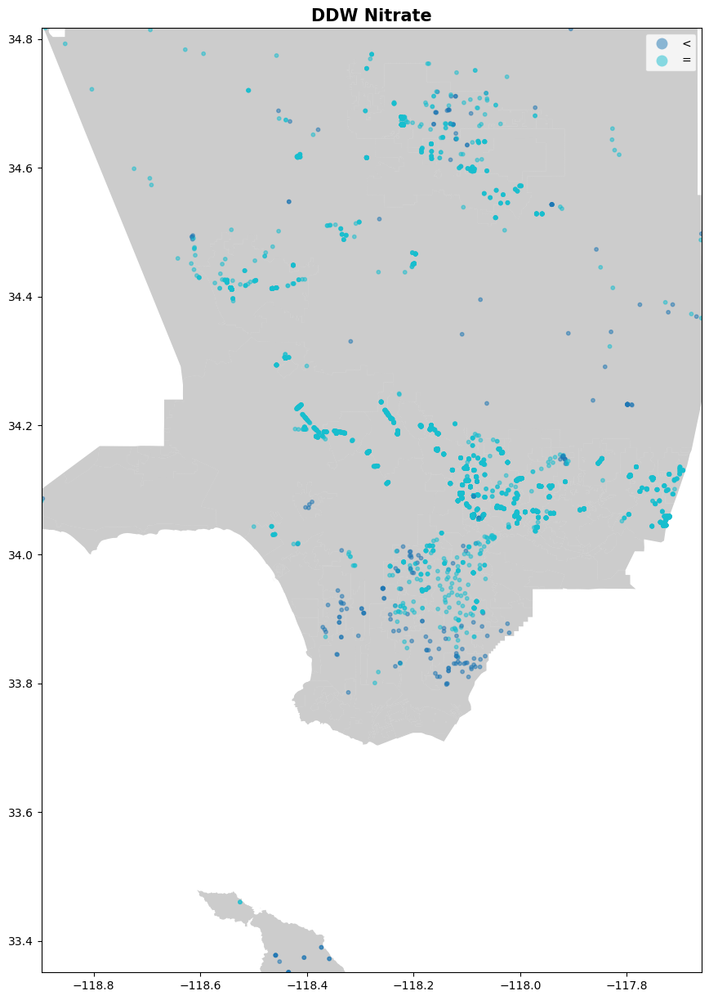

In [53]:
fig, ax = plt.subplots(figsize = (15,15))

map.plot(ax=ax, alpha = 0.4, color = 'grey')


geo_ddw_2012_NO3N.plot(column = 'GM_RESULT_MODIFIER', ax=ax, alpha = 0.5, legend= True, markersize = 10)

plt.title('DDW Nitrate', fontsize=15, fontweight = 'bold')

plt.xlim(min(geo_ddw_2012_NO3N.GM_LONGITUDE), max(geo_ddw_2012_NO3N.GM_LONGITUDE))
plt.ylim(min(geo_ddw_2012_NO3N.GM_LATITUDE), max(geo_ddw_2012_NO3N.GM_LATITUDE))

plt.show()

In [54]:
geo_ddw_2012_TCE = geo_ddw_2012[geo_ddw_2012['GM_CHEMICAL_VVL'] == 'TCE']

In [55]:
geo_ddw_2012_TCE.explore(
     column="GM_RESULT_MODIFIER", # make choropleth based on "Neighborhood" column
     tooltip='GM_RESULT', # show the values of the columns in tooltip (on hover)
     legend= 'GM_RESULT_MODIFIER',
     popup=True, # show all values in popup (on click)
   
    )

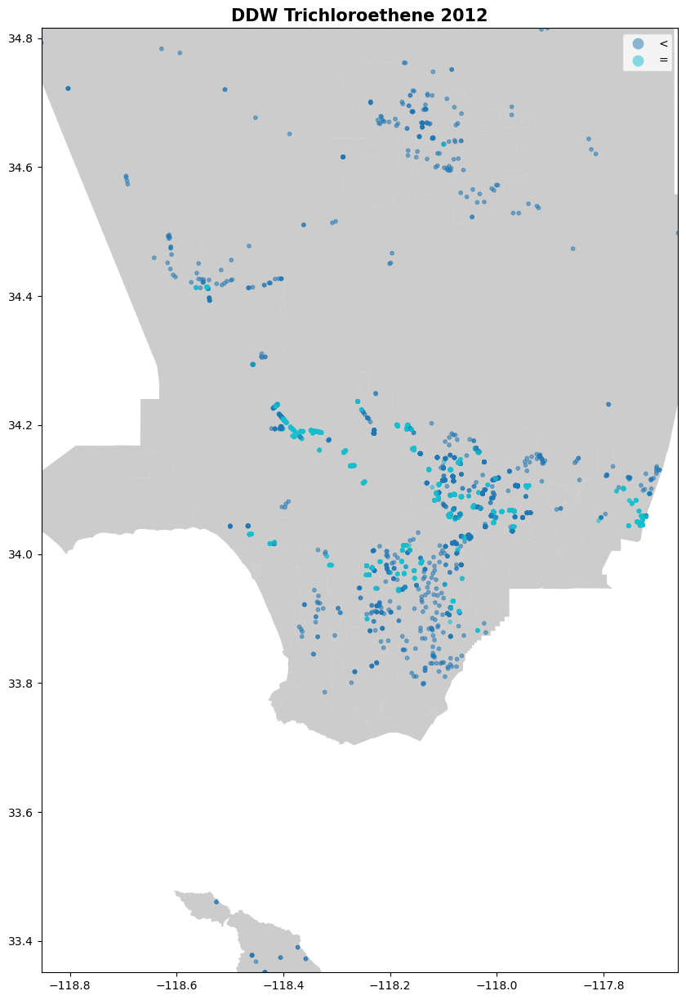

In [63]:
fig, ax = plt.subplots(figsize = (15,15))

map.plot(ax=ax, alpha = 0.4, color = 'grey')


geo_ddw_2012_TCE.plot(column = 'GM_RESULT_MODIFIER', ax=ax, alpha = 0.5, legend= True, markersize = 10)

plt.title('DDW Trichloroethene 2012', fontsize=15, fontweight = 'bold')

plt.xlim(min(geo_ddw_2012_TCE.GM_LONGITUDE), max(geo_ddw_2012_TCE.GM_LONGITUDE))
plt.ylim(min(geo_ddw_2012_TCE.GM_LATITUDE), max(geo_ddw_2012_TCE.GM_LATITUDE))

plt.show()

In [60]:
geo_ddw_2022_TCE = geo_ddw[(geo_ddw['GM_CHEMICAL_VVL'] == 'TCE') & (geo_ddw['YEAR'] == 2022)]


In [61]:
def geoplot(df, map, title):
    fig, ax = plt.subplots(figsize = (15,15))
    map=map
    map.plot(ax=ax, alpha = 0.4, color = 'grey')


    df.plot(column = 'GM_RESULT_MODIFIER', ax=ax, alpha = 0.5, legend= True, markersize = 10)

    plt.title(col_name, fontsize=15, fontweight = 'bold')

    plt.xlim(min(df.GM_LONGITUDE), max(df.GM_LONGITUDE))
    plt.ylim(min(df.GM_LATITUDE), max(df.GM_LATITUDE))

    plt.show()

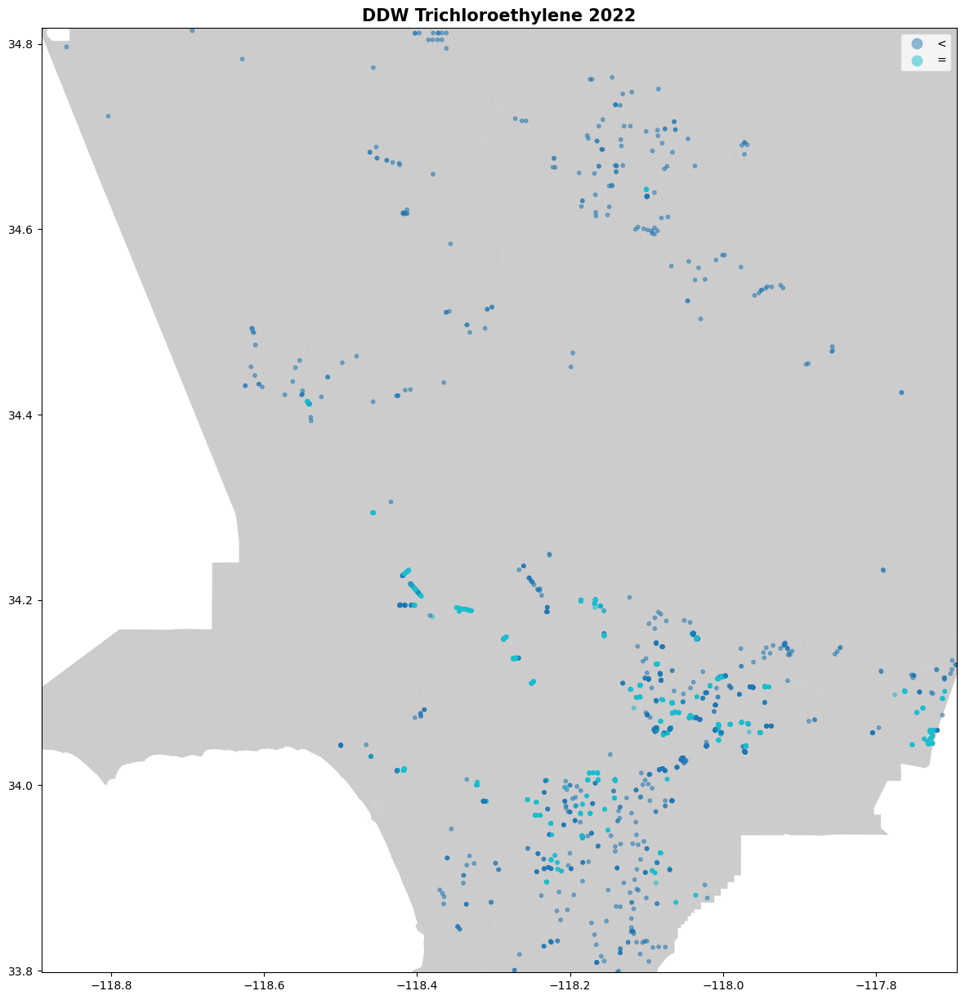

In [62]:
geoplot(geo_ddw_2022_TCE, map, 'DDW Trichloroethylene 2022')

In [64]:
geo_ddw_2022_TCE.explore(
     column="GM_RESULT_MODIFIER", # make choropleth based on "Neighborhood" column
     tooltip='GM_RESULT', # show the values of the columns in tooltip (on hover)
     legend= 'GM_RESULT_MODIFIER',
     popup=True, # show all values in popup (on click)
   
    )